<a href="https://colab.research.google.com/github/wackykm/DataScience/blob/main/Segunda_entrega_Kevin_Martin.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Segunda entrega - Alzheimers Dataset

#Martin, Kevin

#Comision 61170

# Abstracto
Este proyecto tiene como objetivo explorar los factores asociados con la enfermedad de Alzheimer utilizando un conjunto de datos completo que comprende variables demográficas, de estilo de vida, médicas, cognitivas y funcionales. Al realizar análisis estadísticos y aplicar técnicas de aprendizaje automático, identificamos variables clave que contribuyen significativamente al diagnóstico de la enfermedad de Alzheimer. Los hallazgos pueden proporcionar información valiosa para que los profesionales de la salud y los investigadores comprendan mejor los predictores de la enfermedad de Alzheimer y ayuden en el diagnóstico y la intervención tempranos.

# Motivación
La enfermedad de Alzheimer es un trastorno neurológico progresivo que afecta a millones de personas en todo el mundo y provoca deterioro cognitivo, pérdida de memoria y deterioro del funcionamiento diario. Comprender los factores que contribuyen a la aparición y progresión de la enfermedad de Alzheimer es crucial para desarrollar estrategias eficaces de prevención y tratamiento. Este conjunto de datos, que incluye una amplia gama de variables, desde detalles demográficos hasta mediciones clínicas, ofrece una oportunidad única para estudiar la compleja interacción de factores asociados con la enfermedad de Alzheimer. Al analizar este conjunto de datos, podemos descubrir patrones y relaciones importantes que pueden ayudar en el diagnóstico temprano y mejorar los resultados de los pacientes.

# Audiencia
La audiencia principal de este proyecto incluye:

Profesionales de la salud (médicos, enfermeras y cuidadores) que buscan comprender mejor los factores de riesgo y los indicadores tempranos de la enfermedad de Alzheimer.
Investigadores y académicos en los campos de la neurología, la geriatría y la salud pública que estudian la enfermedad de Alzheimer y afecciones relacionadas.
Científicos de datos y profesionales del aprendizaje automático interesados ​​en aplicar técnicas de modelado predictivo a datos sanitarios.

# Objetivo
El objetivo de este proyecto es identificar las variables más significativas asociadas a la Enfermedad de Alzheimer mediante análisis estadístico y técnicas de aprendizaje automático. Específicamente, nuestro objetivo es:

Realizar análisis de datos exploratorios para comprender la distribución y las relaciones de las variables.
Identificar las características más importantes que contribuyen al diagnóstico de la enfermedad de Alzheimer utilizando modelos de aprendizaje automático.
Proporcionar ideas y recomendaciones basadas en el análisis para ayudar en el diagnóstico temprano y las estrategias de intervención.

# Preguntas de investigación:

1. ¿Qué factores demográficos (edad, género, origen étnico, nivel educativo) están más asociados con la enfermedad de Alzheimer?
2. ¿Cómo influyen los factores del estilo de vida (IMC, tabaquismo, consumo de alcohol, actividad física, calidad de la dieta, calidad del sueño) en el riesgo de enfermedad de Alzheimer?
3. ¿Cuál es la relación entre los antecedentes médicos (antecedentes familiares de Alzheimer, enfermedades cardiovasculares, diabetes, depresión, traumatismo craneoencefálico, hipertensión) y la enfermedad de Alzheimer?
4. ¿Cómo se correlacionan las mediciones clínicas (presión arterial, niveles de colesterol) con la enfermedad de Alzheimer?
5. ¿Qué evaluaciones cognitivas y funcionales (MMSE, ADL, problemas de memoria, problemas de conducta) son más predictivas de la enfermedad de Alzheimer?

#Hipótesis:

1. Factores demográficos: la edad avanzada y los niveles educativos más bajos se asocian con un mayor riesgo de enfermedad de Alzheimer.
2. Factores del estilo de vida: la mala calidad de la dieta, la baja actividad física y el tabaquismo se correlacionan positivamente con la enfermedad de Alzheimer.
3. Historial médico: los pacientes con antecedentes familiares de Alzheimer, enfermedades cardiovasculares y diabetes tienen más probabilidades de ser diagnosticados con la enfermedad de Alzheimer.



In [ ]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import textwrap
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, classification_report, roc_curve

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from pandas.plotting import parallel_coordinates, radviz
import statsmodels.api as sm

#Para mejor estetica
mpl.style.use('bmh')

# Información del paciente dado en el dataset
- PatientID: un identificador único asignado a cada paciente (4751 a 6900).
## Detalles demográficos
- Age: La edad de los pacientes oscila entre 60 y 90 años.
- Gender: Género de los pacientes, donde 0 representa Masculino y 1 representa Femenino.
- Ethnicity: la etnia de los pacientes, codificada de la siguiente manera: 0: caucásico 1: afroamericano 2: asiático 3: otro
- Education levels: El nivel educativo de los pacientes, codificado de la siguiente manera: 0: Ninguno 1: Secundaria 2: Licenciatura 3: Superior
## Factores de estilo de vida
- BMI: Índice de Masa Corporal de los pacientes, oscilando entre 15 y 40.
- Smoking: Estado de fumar, donde 0 indica No y 1 indica Sí.
- AlcoholConsumption: Consumo semanal de alcohol en unidades, que van de 0 a 20.
- PhysicalActivity: Actividad física semanal en horas, que van de 0 a 10.
- DietQuality: puntuación de calidad de la dieta, que va de 0 a 10.
- SleepQuality: puntuación de calidad del sueño, que va de 4 a 10.
## Historial médico
- FamilyHistoryAlzheimers: Antecedentes familiares de la enfermedad de Alzheimer, donde 0 indica No y 1 indica Sí.
- Enfermedad Cardiovascular: Presencia de enfermedad cardiovascular, donde 0 indica No y 1 indica Sí.
- Diabetes: Presencia de diabetes, donde 0 indica No y 1 indica Sí.
- Depresión: Presencia de depresión, donde 0 indica No y 1 indica Sí.
- HeadInjury: Historial de lesión en la cabeza, donde 0 indica No y 1 indica Sí.
- Hipertensión: Presencia de hipertensión, donde 0 indica No y 1 indica Sí.
## Mediciones clínicas
- SystolicBP: Presión arterial sistólica, que oscila entre 90 y 180 mmHg.
- DiastolicBP: Presión arterial diastólica, que oscila entre 60 y 120 mmHg.
- CholesterolTotal: Niveles de colesterol total, que oscilan entre 150 y 300 mg/dL.
- CholesterolLDL: Niveles de colesterol unido a lipoproteínas de baja densidad, que oscilan entre 50 y 200 mg/dL.
- CholesterolHDL: Niveles de colesterol unido a lipoproteínas de alta densidad, que oscilan entre 20 y 100 mg/dL.
- CholesterolTriglycerides: Niveles de triglicéridos, que oscilan entre 50 y 400 mg/dL.
## Evaluaciones cognitivas y funcionales
- MMSE: Puntuación del Mini Examen del Estado Mental, que va de 0 a 30. Las puntuaciones más bajas indican deterioro cognitivo.
- FunctionalAssessment: Puntuación de la evaluación funcional, que va de 0 a 10. Las puntuaciones más bajas indican un mayor deterioro.
- MemoryComplaints: Presencia de problemas de memoria, donde 0 indica No y 1 indica Sí.
- BehavioralProblems: Presencia de problemas de conducta, donde 0 indica No y 1 indica Sí.
- ADL: Puntuación de actividades de la vida diaria, que va de 0 a 10. Las puntuaciones más bajas indican un mayor deterioro.
## Síntomas
- Confusion: Presencia de confusión, donde 0 indica No y 1 indica Sí.
- Disorientation: Presencia de desorientación, donde 0 indica No y 1 indica Sí.
- PersonalityChanges: Presencia de cambios de personalidad, donde 0 indica No y 1 indica Sí.
- DifficultyCompletingTasks: Presencia de dificultad para completar tareas, donde 0 indica No y 1 indica Sí.
- Forgetfulness: Presencia de olvido, donde 0 indica No y 1 indica Sí.
## Información de diagnóstico
- Diagnosis: Estado del diagnóstico de la enfermedad de Alzheimer, donde 0 indica No y 1 indica Sí.
## Información confidencial
- DoctorInCharge: Esta columna contiene información confidencial sobre el médico a cargo, con "XXXConfid" como valor para todos los pacientes.

#Análisis Exploratorio de Datos (EDA)
## Montaje Inicial del Dataset

In [ ]:
# Importación de Google Drive
from google.colab import drive

# Montaje de Google Drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
%cd gdrive/MyDrive/CoderHouse/Data Science/Datasets

/content/gdrive/MyDrive/CoderHouse/Data Science/Datasets


In [ ]:
# Dataset obtenido de: https://www.kaggle.com/datasets/rabieelkharoua/alzheimers-disease-dataset# Acceso a la carpeta de la entrega:
# Acceso a la carpeta de la entrega: https://drive.google.com/drive/folders/1Lqk03a4FWjVTFb68OUhrGrqtVRgHyZen?usp=sharing

# Se genera la lectura del csv para crear un DataFrame
alz = pd.read_csv('alzheimers_disease_data.csv')

#Se eliminan las filas con datos nulos
alz = alz.dropna()

#Se eliminan la fila de doctor
alz = alz.drop(columns=['DoctorInCharge'])

# Se genera un print del head del DataFrame creado para probar que funcione, visualizando las 10 primeras filas.
alz.head(10)

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis
0,4751,73,0,0,2,22.927749,0,13.297218,6.327112,1.347214,...,6.518877,0,0,1.725883,0,0,0,1,0,0
1,4752,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,...,7.118696,0,0,2.592424,0,0,0,0,1,0
2,4753,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,...,5.895077,0,0,7.119548,0,1,0,1,0,0
3,4754,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,...,8.965106,0,1,6.481226,0,0,0,0,0,0
4,4755,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,...,6.045039,0,0,0.014691,0,0,1,1,0,0
5,4756,86,1,1,1,30.626886,0,4.140144,0.211062,1.584922,...,5.510144,0,0,9.015686,1,0,0,0,0,0
6,4757,68,0,3,2,38.387622,1,0.646047,9.257695,5.897388,...,6.062124,0,0,9.236328,0,0,0,0,1,0
7,4758,75,0,0,1,18.776009,0,13.723826,4.649451,8.341903,...,3.401374,0,0,4.517248,1,0,0,0,1,1
8,4759,72,1,1,0,27.833188,0,12.167848,1.531360,6.736882,...,7.396061,0,1,0.756232,0,0,1,0,0,0
9,4760,87,0,0,0,35.456302,1,16.028688,6.440773,8.086019,...,1.148904,0,1,4.554394,0,0,0,0,0,0


In [ ]:
# Se visualiza también los últimos 10 elementos
alz.tail(10)

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis
2139,6890,68,0,1,0,17.828965,0,2.982747,8.394826,0.317526,...,9.104117,0,0,8.819115,0,0,0,1,0,0
2140,6891,89,0,1,2,34.422419,0,7.770687,0.947567,5.732139,...,1.605154,0,0,8.734082,0,1,0,0,0,0
2141,6892,72,0,0,2,21.600144,0,19.391766,8.181469,6.640195,...,8.722739,0,0,9.570776,0,0,0,0,1,0
2142,6893,88,0,0,0,20.097600,0,4.089458,7.389633,2.878738,...,7.729270,0,0,6.156040,0,0,0,1,0,1
2143,6894,66,1,2,1,32.013806,1,9.308706,4.352402,5.432374,...,1.405821,0,0,4.544538,0,0,0,1,1,1
2144,6895,61,0,0,1,39.121757,0,1.561126,4.049964,6.555306,...,0.238667,0,0,4.492838,1,0,0,0,0,1
2145,6896,75,0,0,2,17.857903,0,18.767261,1.360667,2.904662,...,8.687480,0,1,9.204952,0,0,0,0,0,1
2146,6897,77,0,0,1,15.476479,0,4.594670,9.886002,8.120025,...,1.972137,0,0,5.036334,0,0,0,0,0,1
2147,6898,78,1,3,1,15.299911,0,8.674505,6.354282,1.263427,...,5.173891,0,0,3.785399,0,0,0,0,1,1
2148,6899,72,0,0,2,33.289738,0,7.890703,6.570993,7.941404,...,6.307543,0,1,8.327563,0,1,0,0,1,0


In [ ]:
#Se obtiene información incial de las distintas columnas, así como el cumplimiento de entradas y de columnas
alz.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2149 entries, 0 to 2148
Data columns (total 34 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   PatientID                  2149 non-null   int64  
 1   Age                        2149 non-null   int64  
 2   Gender                     2149 non-null   int64  
 3   Ethnicity                  2149 non-null   int64  
 4   EducationLevel             2149 non-null   int64  
 5   BMI                        2149 non-null   float64
 6   Smoking                    2149 non-null   int64  
 7   AlcoholConsumption         2149 non-null   float64
 8   PhysicalActivity           2149 non-null   float64
 9   DietQuality                2149 non-null   float64
 10  SleepQuality               2149 non-null   float64
 11  FamilyHistoryAlzheimers    2149 non-null   int64  
 12  CardiovascularDisease      2149 non-null   int64  
 13  Diabetes                   2149 non-null   int64

In [ ]:
# Se verifica que no hayan quedado datos nulos
alz.isnull().sum()

,0
PatientID,0
Age,0
Gender,0
Ethnicity,0
EducationLevel,0
BMI,0
Smoking,0
AlcoholConsumption,0
PhysicalActivity,0
DietQuality,0


In [ ]:
# Se genera un describe para obtener los datos básicos de las distintas columnas
alz.describe()

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis
count,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,...,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000
mean,5825.000000,74.908795,0.506282,0.697534,1.286645,27.655697,0.288506,10.039442,4.920202,4.993138,...,5.080055,0.208004,0.156817,4.982958,0.205212,0.158213,0.150768,0.158678,0.301536,0.353653
std,620.507185,8.990221,0.500077,0.996128,0.904527,7.217438,0.453173,5.757910,2.857191,2.909055,...,2.892743,0.405974,0.363713,2.949775,0.403950,0.365026,0.357906,0.365461,0.459032,0.478214
min,4751.000000,60.000000,0.000000,0.000000,0.000000,15.008851,0.000000,0.002003,0.003616,0.009385,...,0.000460,0.000000,0.000000,0.001288,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5288.000000,67.000000,0.000000,0.000000,1.000000,21.611408,0.000000,5.139810,2.570626,2.458455,...,2.566281,0.000000,0.000000,2.342836,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5825.000000,75.000000,1.000000,0.000000,1.000000,27.823924,0.000000,9.934412,4.766424,5.076087,...,5.094439,0.000000,0.000000,5.038973,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,6362.000000,83.000000,1.000000,1.000000,2.000000,33.869778,1.000000,15.157931,7.427899,7.558625,...,7.546981,0.000000,0.000000,7.581490,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
max,6899.000000,90.000000,1.000000,3.000000,3.000000,39.992767,1.000000,19.989293,9.987429,9.998346,...,9.996467,1.000000,1.000000,9.999747,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


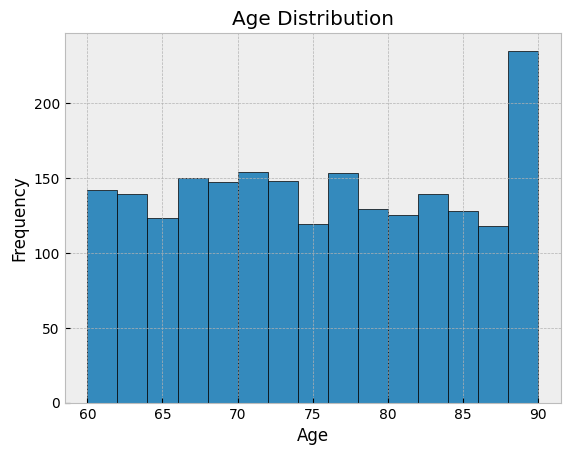

In [ ]:
#Se hace un analisis exploratorio con la distribucion de edad
plt.hist(alz['Age'], bins=15, edgecolor='black')
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

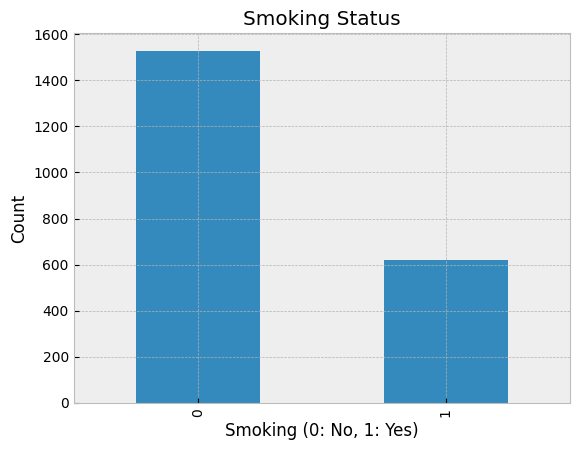

In [ ]:
# Y de cuantos fuman
alz['Smoking'].value_counts().plot(kind='bar')
plt.title('Smoking Status')
plt.xlabel('Smoking (0: No, 1: Yes)')
plt.ylabel('Count')
plt.show()

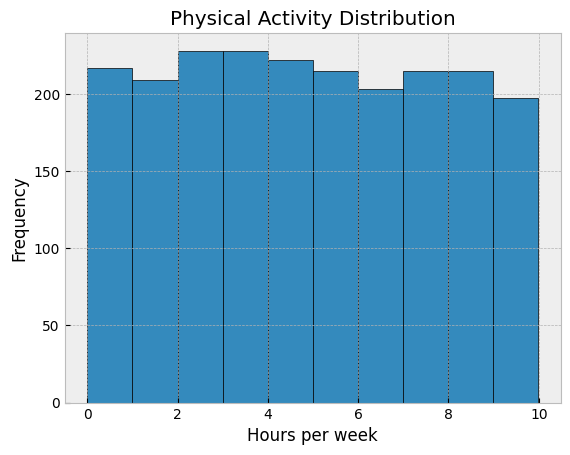

In [ ]:
# Y de cuanta actividad fisica hacen
plt.hist(alz['PhysicalActivity'], bins=10, edgecolor='black')
plt.title('Physical Activity Distribution')
plt.xlabel('Hours per week')
plt.ylabel('Frequency')
plt.show()

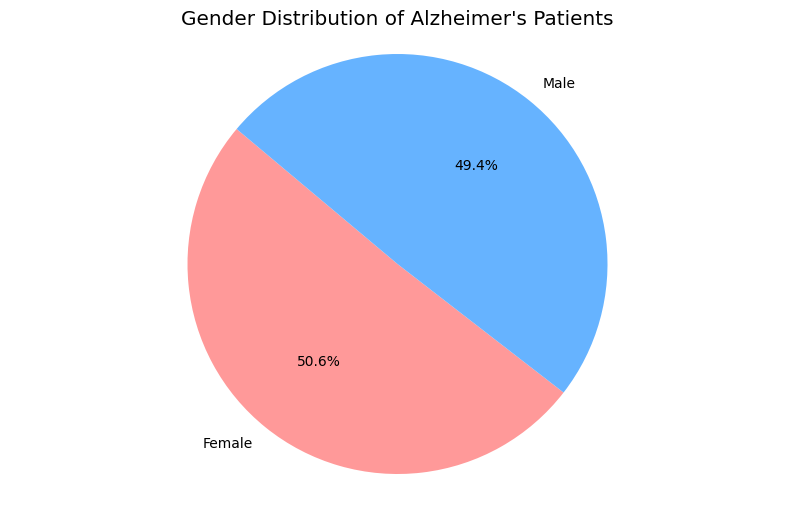

Counts of each gender:
Gender
1    1088
0    1061
Name: count, dtype: int64


In [ ]:
#  Distribution del genero

gender_counts = alz['Gender'].value_counts()

# Plotting the pie chart
plt.figure(figsize=(10, 6))
plt.pie(gender_counts, labels=['Female', 'Male'], autopct='%1.1f%%', startangle=140, colors=['#ff9999','#66b3ff'])
plt.title("Gender Distribution of Alzheimer's Patients")
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

# Printing the counts
print("Counts of each gender:")
print(gender_counts)

Se puede observar que tenemos un dataset con practicamente 50% de hombres y de muejeres.

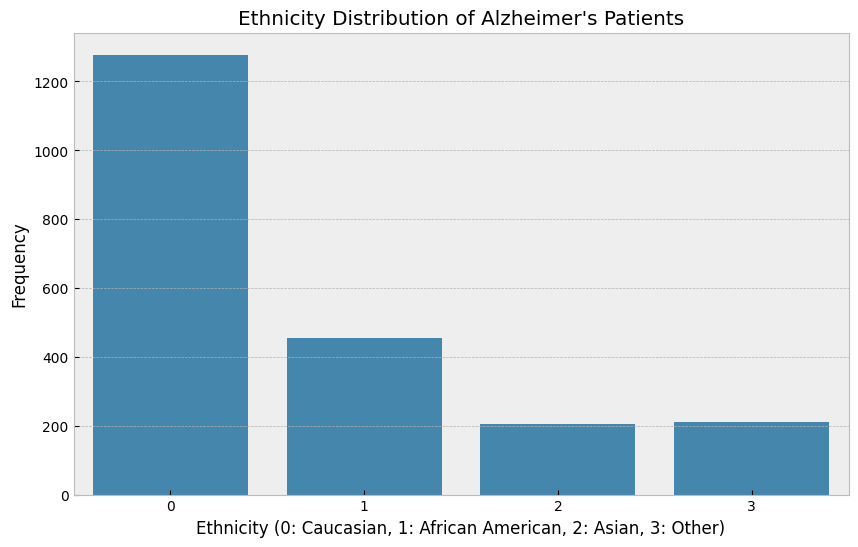

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Ethnicity', data=alz)
plt.title('Ethnicity Distribution of Alzheimer\'s Patients')
plt.xlabel('Ethnicity (0: Caucasian, 1: African American, 2: Asian, 3: Other)')
plt.ylabel('Frequency')
plt.show()

El data set tiene mayormente personas blancas que otras etnicidades. A continuacion se hace un analisis de algunas variables por etnicidad.
Para visualizar la distribución de estas variables por origen étnico, se puede crear múltiples gráficos de recuento o gráficos de barras para cada variable.

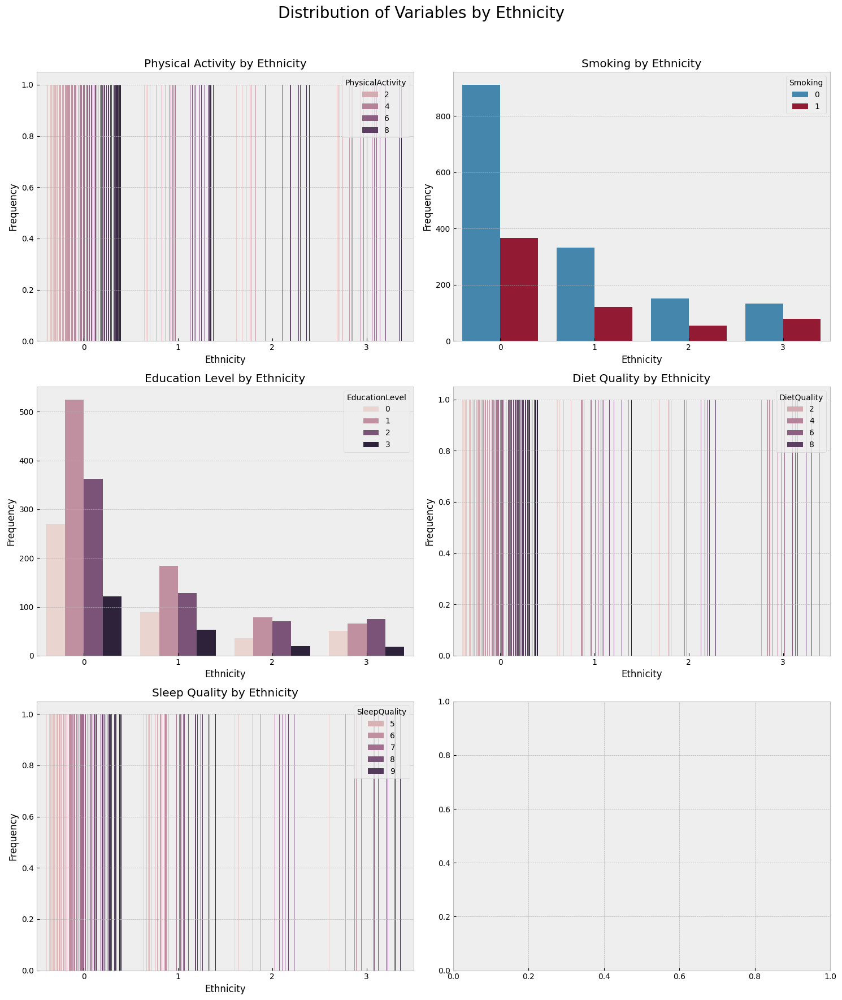

In [ ]:
# Set up the figure and axes
fig, axes = plt.subplots(3, 2, figsize=(15, 18))
fig.suptitle('Distribution of Variables by Ethnicity', fontsize=20)

# Plot for Physical Activity
sns.countplot(x='Ethnicity', hue='PhysicalActivity', data=alz, ax=axes[0, 0])
axes[0, 0].set_title('Physical Activity by Ethnicity')
axes[0, 0].set_xlabel('Ethnicity')
axes[0, 0].set_ylabel('Frequency')

# Plot for Smoking
sns.countplot(x='Ethnicity', hue='Smoking', data=alz, ax=axes[0, 1])
axes[0, 1].set_title('Smoking by Ethnicity')
axes[0, 1].set_xlabel('Ethnicity')
axes[0, 1].set_ylabel('Frequency')

# Plot for Education Level
sns.countplot(x='Ethnicity', hue='EducationLevel', data=alz, ax=axes[1, 0])
axes[1, 0].set_title('Education Level by Ethnicity')
axes[1, 0].set_xlabel('Ethnicity')
axes[1, 0].set_ylabel('Frequency')

# Plot for Diet Quality
sns.countplot(x='Ethnicity', hue='DietQuality', data=alz, ax=axes[1, 1])
axes[1, 1].set_title('Diet Quality by Ethnicity')
axes[1, 1].set_xlabel('Ethnicity')
axes[1, 1].set_ylabel('Frequency')

# Plot for Sleep Quality
sns.countplot(x='Ethnicity', hue='SleepQuality', data=alz, ax=axes[2, 0])
axes[2, 0].set_title('Sleep Quality by Ethnicity')
axes[2, 0].set_xlabel('Ethnicity')
axes[2, 0].set_ylabel('Frequency')

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

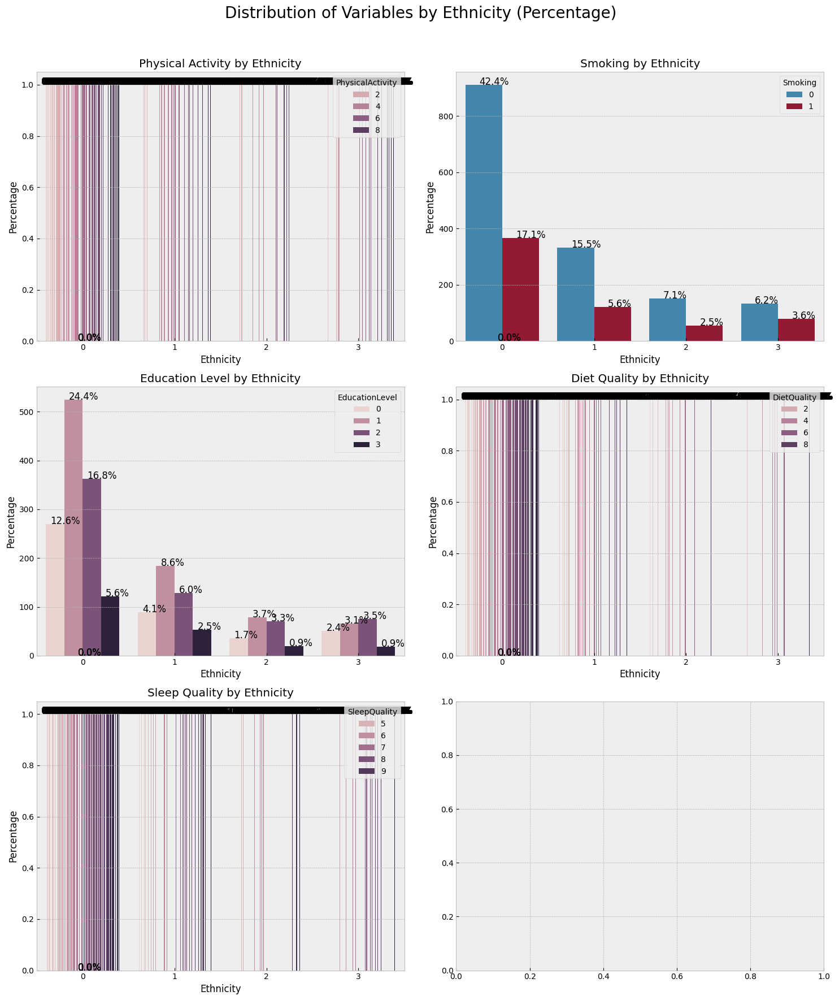

In [ ]:
# Function to plot count plots with percentages
def plot_percentage_countplot(data, x, hue, ax):
    total = len(data)
    sns.countplot(x=x, hue=hue, data=data, ax=ax)
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height() / total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), size=12)
    ax.set_ylabel('Percentage')

# Set up the figure and axes
fig, axes = plt.subplots(3, 2, figsize=(15, 18))
fig.suptitle('Distribution of Variables by Ethnicity (Percentage)', fontsize=20)

# Plot for Physical Activity
plot_percentage_countplot(alz, x='Ethnicity', hue='PhysicalActivity', ax=axes[0, 0])
axes[0, 0].set_title('Physical Activity by Ethnicity')

# Plot for Smoking
plot_percentage_countplot(alz, x='Ethnicity', hue='Smoking', ax=axes[0, 1])
axes[0, 1].set_title('Smoking by Ethnicity')

# Plot for Education Level
plot_percentage_countplot(alz, x='Ethnicity', hue='EducationLevel', ax=axes[1, 0])
axes[1, 0].set_title('Education Level by Ethnicity')

# Plot for Diet Quality
plot_percentage_countplot(alz, x='Ethnicity', hue='DietQuality', ax=axes[1, 1])
axes[1, 1].set_title('Diet Quality by Ethnicity')

# Plot for Sleep Quality
plot_percentage_countplot(alz, x='Ethnicity', hue='SleepQuality', ax=axes[2, 0])
axes[2, 0].set_title('Sleep Quality by Ethnicity')

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

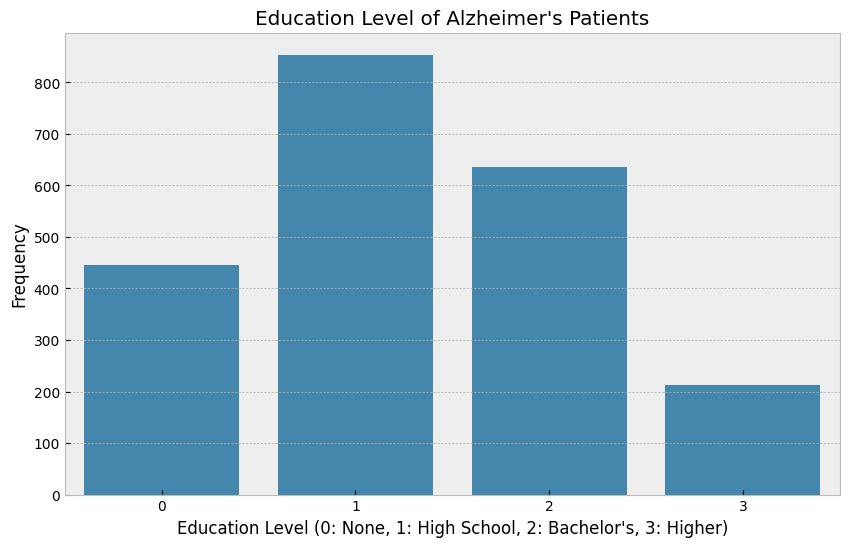

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(x='EducationLevel', data=alz)
plt.title('Education Level of Alzheimer\'s Patients')
plt.xlabel('Education Level (0: None, 1: High School, 2: Bachelor\'s, 3: Higher)')
plt.ylabel('Frequency')
plt.show()

Conclusion:
- Es interesante ver como los extremos de no educacion y de educacion superior a un bachelors demuestran menos cantidad de personas con alzheimers. Es posible que personas sin educacion tambien sean personas con menos recursos y son personas que no estan en el estudio porque mueren antes por no tener la atencion necesaria. Y a lo opuesto, lo mas probable es que personas con educacion superior tenga mas recursos, por lo que lleva a que es posible que detecten la enfermedad antes y se trata.

# Desarrollo de las preguntas e hipótesis


In [ ]:
#

# ¿Cómo influyen los factores del estilo de vida (IMC, tabaquismo, consumo de alcohol, actividad física, calidad de la dieta, calidad del sueño) en el riesgo de enfermedad de Alzheimer?

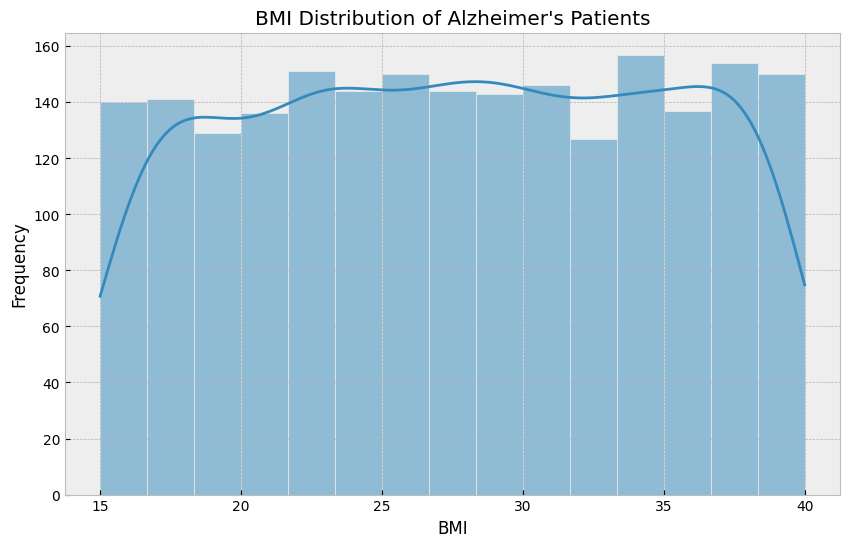

In [ ]:
# BMI Distribucion
plt.figure(figsize=(10, 6))
sns.histplot(alz['BMI'], bins=15, kde=True)
plt.title('BMI Distribution of Alzheimer\'s Patients')
plt.xlabel('BMI')
plt.ylabel('Frequency')
plt.show()

Conclusion:
- Como se considera que un BMI saludable se encuentra entre los rangos 18 y 25, aca se observa que no hay una relacion demasiada alta en cuanto al BMI y la cantidad de personas con alzheimers. Hay una disminucion minima en el BMI 18 y va en aumento y despues es bastante parejo. Parece haber menos personas en este dataset con un BMI de 33 pero no es analizable en ese sentido.

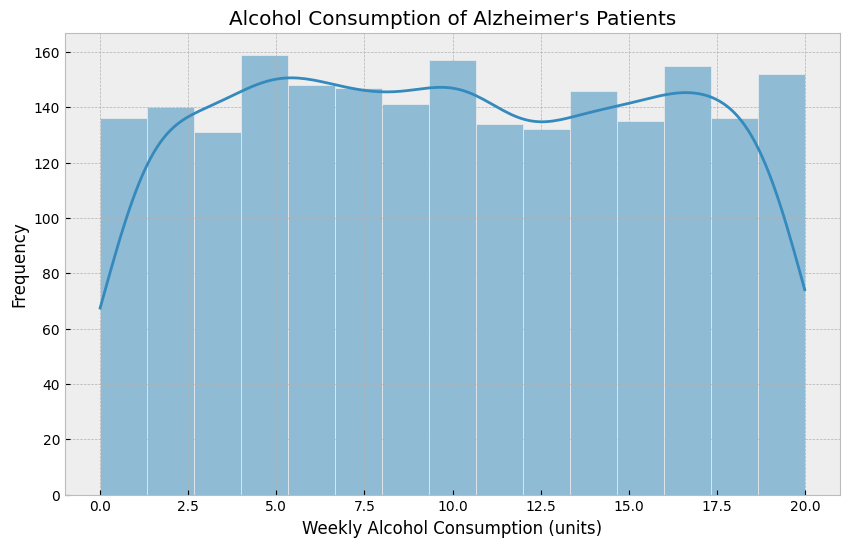

In [ ]:
# Distribución del consumo de alcohol
plt.figure(figsize=(10, 6))
sns.histplot(alz['AlcoholConsumption'], bins=15, kde=True)
plt.title('Alcohol Consumption of Alzheimer\'s Patients')
plt.xlabel('Weekly Alcohol Consumption (units)')
plt.ylabel('Frequency')
plt.show()

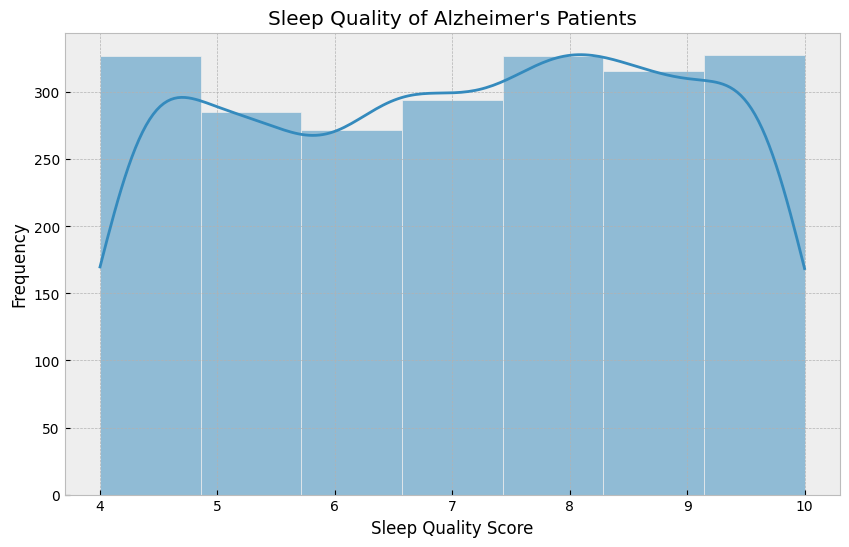

In [ ]:
# Distribución de la calidad del sueñoplt.figure(figsize=(10, 6))
sns.histplot(alz['SleepQuality'], bins=7, kde=True)
plt.title('Sleep Quality of Alzheimer\'s Patients')
plt.xlabel('Sleep Quality Score')
plt.ylabel('Frequency')
plt.show()

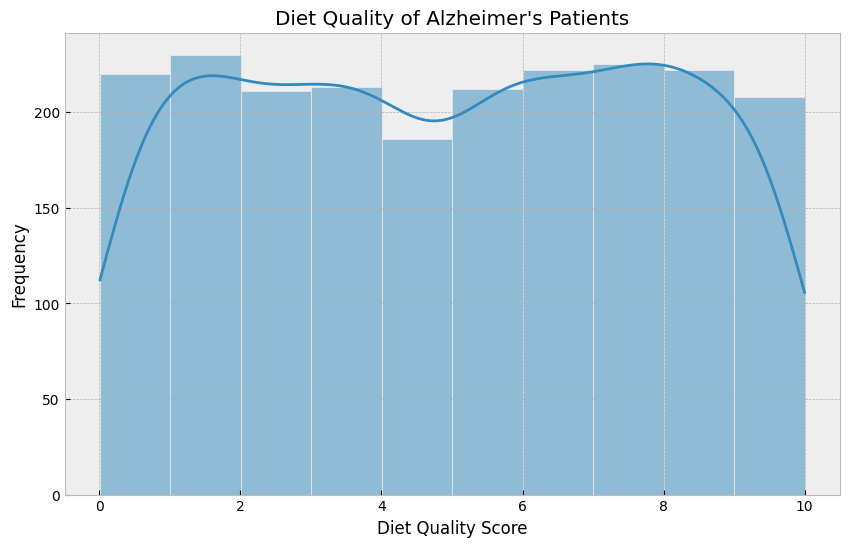

In [ ]:
# Distribución de la calidad de la dieta
plt.figure(figsize=(10, 6))
sns.histplot(alz['DietQuality'], bins=10, kde=True)
plt.title('Diet Quality of Alzheimer\'s Patients')
plt.xlabel('Diet Quality Score')
plt.ylabel('Frequency')
plt.show()

#¿Cuál es la relación entre los antecedentes médicos (antecedentes familiares de Alzheimer, enfermedades cardiovasculares, diabetes, depresión, traumatismo craneoencefálico, hipertensión) y la enfermedad de Alzheimer?

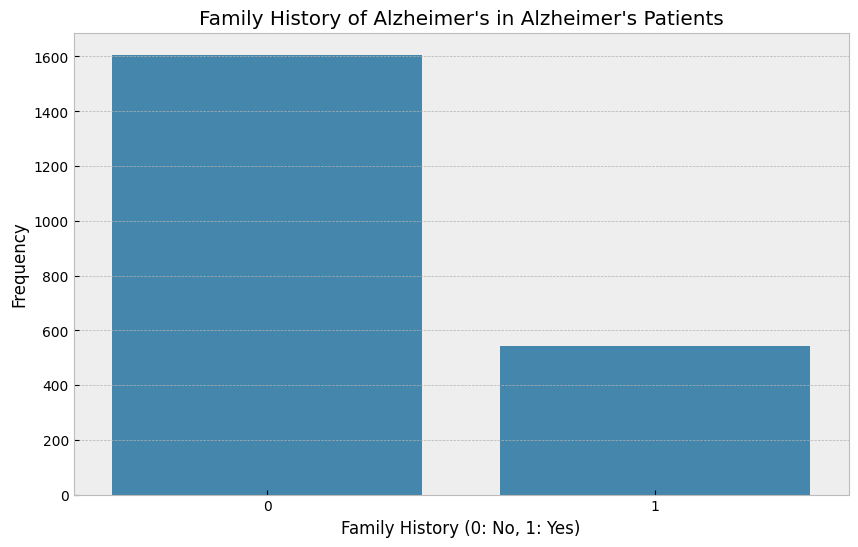

In [ ]:
# Historia familiar de distribución del Alzheimer.plt.figure(figsize=(10, 6))
sns.countplot(x='FamilyHistoryAlzheimers', data=alz)
plt.title('Family History of Alzheimer\'s in Alzheimer\'s Patients')
plt.xlabel('Family History (0: No, 1: Yes)')
plt.ylabel('Frequency')
plt.show()

La mayoria de los casos demuestran que no hay un historial de familia con Alzheimers.

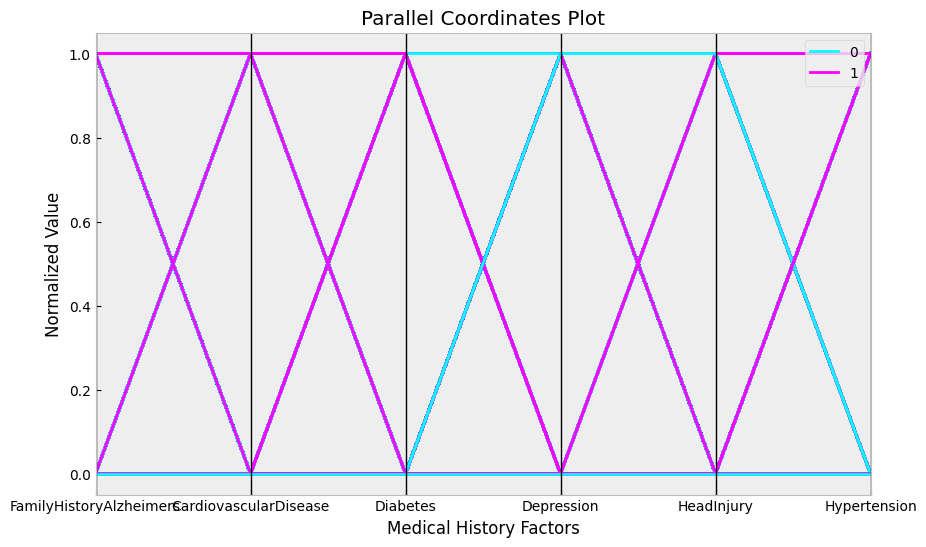

In [ ]:
# Normalizar los datos para una mejor visualización
normalized_data = (
    alz[['FamilyHistoryAlzheimers', 'CardiovascularDisease', 'Diabetes', 'Depression', 'HeadInjury', 'Hypertension']] -
    alz[['FamilyHistoryAlzheimers', 'CardiovascularDisease', 'Diabetes', 'Depression', 'HeadInjury', 'Hypertension']].min()
) / (
    alz[['FamilyHistoryAlzheimers', 'CardiovascularDisease', 'Diabetes', 'Depression', 'HeadInjury', 'Hypertension']].max() -
    alz[['FamilyHistoryAlzheimers', 'CardiovascularDisease', 'Diabetes', 'Depression', 'HeadInjury', 'Hypertension']].min()
)
normalized_data['Diagnosis'] = alz['Diagnosis']

plt.figure(figsize=(10, 6))
parallel_coordinates(normalized_data, 'Diagnosis', colormap='cool')
plt.title('Parallel Coordinates Plot')
plt.xlabel('Medical History Factors')
plt.ylabel('Normalized Value')
plt.show()

Cuando un gráfico de coordenadas paralelas aparece entrecruzado, normalmente indica un alto grado de variabilidad o falta de correlación entre las variables que se están trazando. Cada línea en el gráfico representa una observación, y cuanto más se cruzan las líneas, más diversos son los puntos de datos en las diferentes dimensiones12.

Este entrecruzamiento puede dificultar el discernimiento de patrones o relaciones claras dentro de los datos. Sin embargo, también puede resaltar la complejidad y la naturaleza multidimensional del conjunto de datos, lo que podría requerir análisis o filtrado adicionales para descubrir información significativa.

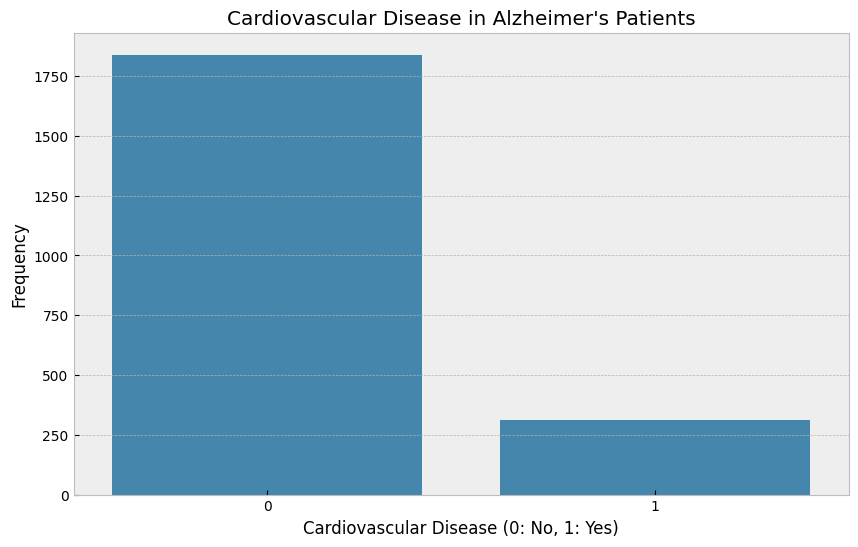

In [ ]:
# Distribución de enfermedades cardiovascularesplt.figure(figsize=(10, 6))
sns.countplot(x='CardiovascularDisease', data=alz)
plt.title('Cardiovascular Disease in Alzheimer\'s Patients')
plt.xlabel('Cardiovascular Disease (0: No, 1: Yes)')
plt.ylabel('Frequency')
plt.show()

# ¿Hay alguna diferencia en el diagnostico entre muejeres y hombres?

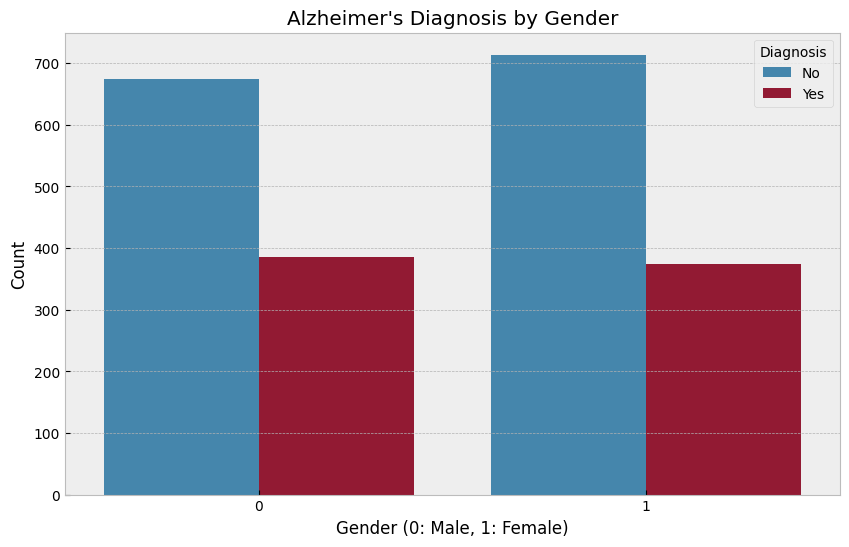

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Gender', hue='Diagnosis', data=alz)
plt.title('Alzheimer\'s Diagnosis by Gender')
plt.xlabel('Gender (0: Male, 1: Female)')
plt.ylabel('Count')
plt.legend(title='Diagnosis', labels=['No', 'Yes'])
plt.show()

Parece que mantienen masomenos el doble de que cada genero NO tiene diagnostico.

# Hay alguna relacion entre la edad y si hacen actividad fisica?
Este diagrama de dispersión muestra la relación entre la edad y la actividad física semanal, con los puntos coloreados por el diagnóstico de Alzheimer.

Nos permite ver si existe un patrón o tendencia en los niveles de actividad física y la edad entre los diagnosticados con la Enfermedad de Alzheimer.

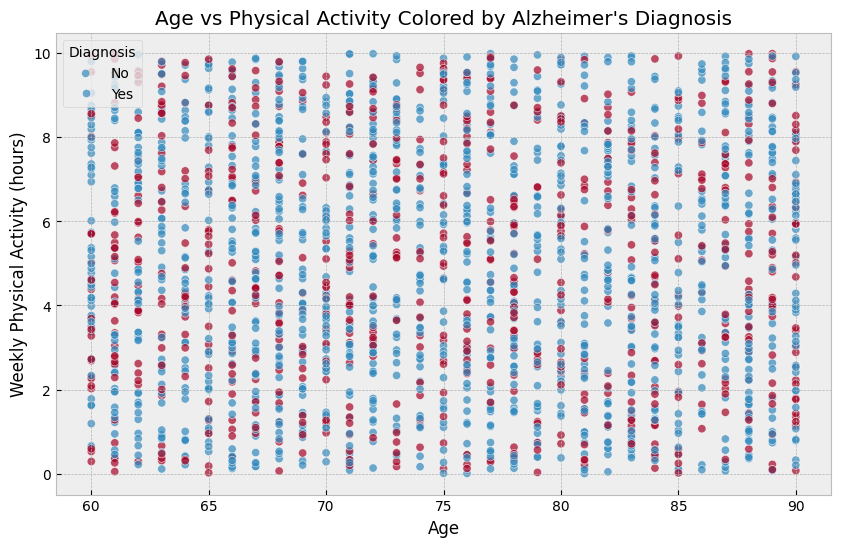

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Age', y='PhysicalActivity', hue='Diagnosis', data=alz, alpha=0.7)
plt.title('Age vs Physical Activity Colored by Alzheimer\'s Diagnosis')
plt.xlabel('Age')
plt.ylabel('Weekly Physical Activity (hours)')
plt.legend(title='Diagnosis', labels=['No', 'Yes'])
plt.show()

A partir de este diagrama de dispersión, parece que no existe una relación fuerte entre la edad y la actividad física semanal que distinga a los pacientes de Alzheimer de los que no lo son. Pacientes de todas las edades y niveles de actividad física están representados tanto en el grupo diagnosticado como en el no diagnosticado. Podría ser necesario un análisis más detallado que involucre variables adicionales o una combinación de variables para identificar patrones más fuertes relacionados con el diagnóstico de Alzheimer.

## Cual es la correlación entre diferentes variables en el conjunto de dato?

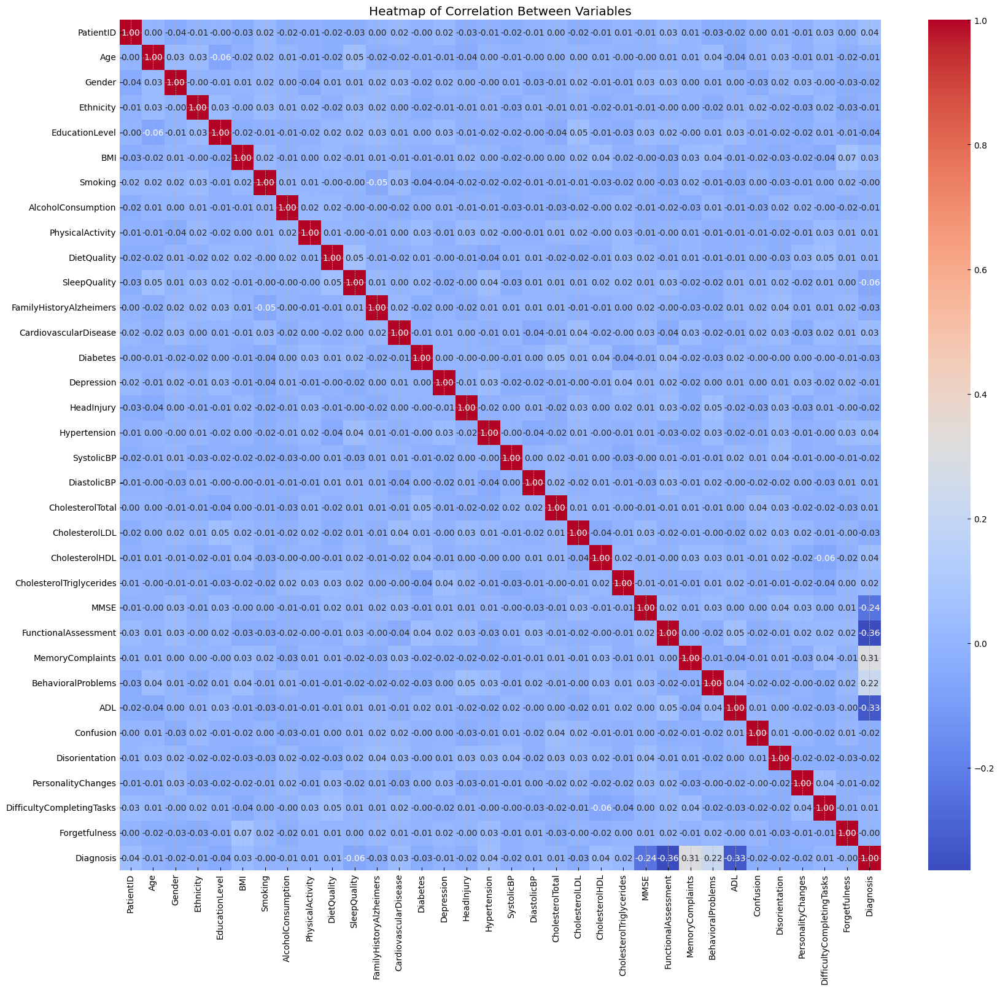

In [ ]:
plt.figure(figsize=(20, 18))
correlation_matrix = alz.corr()
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Heatmap of Correlation Between Variables')
plt.show()

Al parecer no hay correlacion entre los datos

# Hay variables que se pueden ver afectadas dependiendo si hay diagnostico o no?

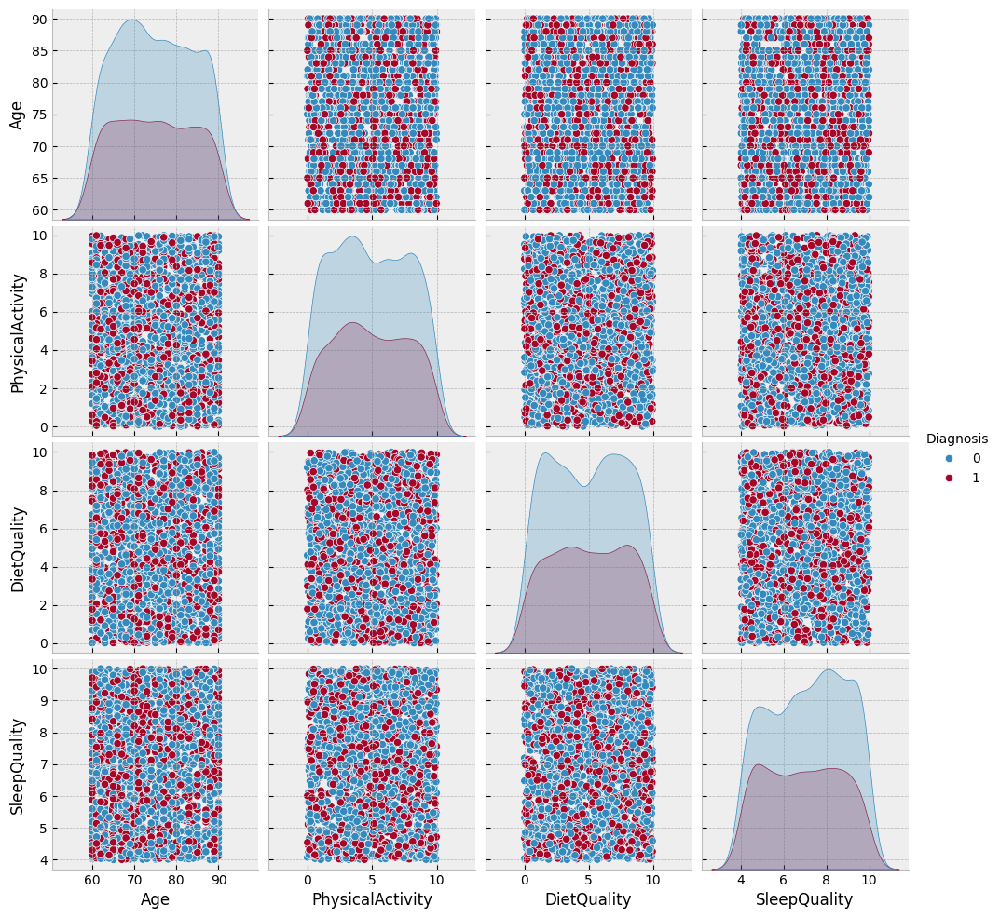

In [ ]:
selected_features = ['Age', 'PhysicalActivity', 'DietQuality', 'SleepQuality', 'Diagnosis']
sns.pairplot(alz[selected_features], hue='Diagnosis', diag_kind='kde')
plt.show()

Parece que no afecta el hecho de que haya o no diagnostico

#¿Cuales son las variables mas repetidas y comunes entre las personas con alzheimer?

In [ ]:
categorical_vars = ['Gender', 'Ethnicity', 'EducationLevel', 'Smoking', 'FamilyHistoryAlzheimers',
                    'CardiovascularDisease', 'Diabetes', 'Depression', 'HeadInjury', 'Hypertension',
                    'MemoryComplaints', 'BehavioralProblems', 'Confusion', 'Disorientation',
                    'PersonalityChanges', 'DifficultyCompletingTasks', 'Forgetfulness']

for var in categorical_vars:
    print(f'\nFrequency of {var} in Alzheimer\'s patients:')
    print(alz[var].value_counts())


Frequency of Gender in Alzheimer's patients:
Gender
1    1088
0    1061
Name: count, dtype: int64

Frequency of Ethnicity in Alzheimer's patients:
Ethnicity
0    1278
1     454
3     211
2     206
Name: count, dtype: int64

Frequency of EducationLevel in Alzheimer's patients:
EducationLevel
1    854
2    636
0    446
3    213
Name: count, dtype: int64

Frequency of Smoking in Alzheimer's patients:
Smoking
0    1529
1     620
Name: count, dtype: int64

Frequency of FamilyHistoryAlzheimers in Alzheimer's patients:
FamilyHistoryAlzheimers
0    1607
1     542
Name: count, dtype: int64

Frequency of CardiovascularDisease in Alzheimer's patients:
CardiovascularDisease
0    1839
1     310
Name: count, dtype: int64

Frequency of Diabetes in Alzheimer's patients:
Diabetes
0    1825
1     324
Name: count, dtype: int64

Frequency of Depression in Alzheimer's patients:
Depression
0    1718
1     431
Name: count, dtype: int64

Frequency of HeadInjury in Alzheimer's patients:
HeadInjury
0    1950
1

In [ ]:
numerical_vars = ['Age', 'BMI', 'AlcoholConsumption', 'PhysicalActivity', 'DietQuality', 'SleepQuality',
                  'SystolicBP', 'DiastolicBP', 'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL',
                  'CholesterolTriglycerides', 'MMSE', 'FunctionalAssessment', 'ADL']

alzheimers_summary = alz[numerical_vars].describe()
print(alzheimers_summary)

               Age          BMI  AlcoholConsumption  PhysicalActivity  \
count  2149.000000  2149.000000         2149.000000       2149.000000   
mean     74.908795    27.655697           10.039442          4.920202   
std       8.990221     7.217438            5.757910          2.857191   
min      60.000000    15.008851            0.002003          0.003616   
25%      67.000000    21.611408            5.139810          2.570626   
50%      75.000000    27.823924            9.934412          4.766424   
75%      83.000000    33.869778           15.157931          7.427899   
max      90.000000    39.992767           19.989293          9.987429   

       DietQuality  SleepQuality   SystolicBP  DiastolicBP  CholesterolTotal  \
count  2149.000000   2149.000000  2149.000000  2149.000000       2149.000000   
mean      4.993138      7.051081   134.264774    89.847836        225.197519   
std       2.909055      1.763573    25.949352    17.592496         42.542233   
min       0.009385    

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler

X = alz.drop(columns=['PatientID', 'Diagnosis'])
y = alz['Diagnosis']

# Codificar variables categóricas
X = pd.get_dummies(X, columns=categorical_vars)

# Divido los datos en conjuntos de entrenamiento y prueba.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# estandarizar los datos
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Entrenar un modelo de bosque aleatorio
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Obtener características importantes
importances = rf.feature_importances_
features = X.columns
feature_importance_df = pd.DataFrame({'Feature': features, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Muestra las 10 características más importantes
print(feature_importance_df.head(10))

                     Feature  Importance
13      FunctionalAssessment    0.180684
14                       ADL    0.153897
12                      MMSE    0.109050
39        MemoryComplaints_0    0.045041
40        MemoryComplaints_1    0.044545
3           PhysicalActivity    0.029729
10            CholesterolHDL    0.028765
11  CholesterolTriglycerides    0.028121
4                DietQuality    0.028040
9             CholesterolLDL    0.026602


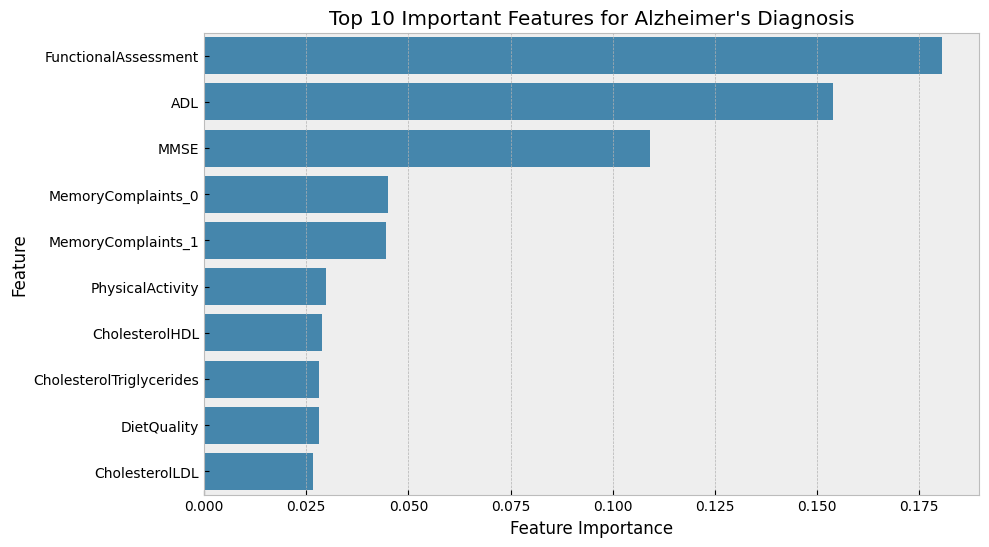

In [ ]:
# Traza las 10 características más importantes
top_features = feature_importance_df.head(10)
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=top_features)
plt.title('Top 10 Important Features for Alzheimer\'s Diagnosis')
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.show()

 El gráfico muestra qué características el modelo Random Forest encontró más influyentes en el diagnóstico de la enfermedad de Alzheimer. Indica que las evaluaciones cognitivas y funcionales (como las puntuaciones MMSE y ADL) son particularmente críticas, junto con las quejas de memoria, la actividad física y los niveles de colesterol.

#Hipotesis - Factores del estilo de vida: la mala calidad de la dieta, la baja actividad física y el tabaquismo se correlacionan positivamente con la enfermedad de Alzheimer.

In [ ]:
# Seleccione características relevantes para la regresión logística
features = ['Age', 'EducationLevel', 'Smoking', 'PhysicalActivity', 'DietQuality',
            'FamilyHistoryAlzheimers', 'CardiovascularDisease', 'Diabetes']
X = alz[features]
y = alz['Diagnosis']

# Agregar una constante al modelo
X = sm.add_constant(X)

# Ajustar el modelo de regresión logística
model = sm.Logit(y, X)
result = model.fit()

# Resumen del análisis de regresión
print(result.summary())

Optimization terminated successfully.
         Current function value: 0.647037
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:              Diagnosis   No. Observations:                 2149
Model:                          Logit   Df Residuals:                     2140
Method:                           MLE   Df Model:                            8
Date:                Fri, 16 Aug 2024   Pseudo R-squ.:                0.004066
Time:                        18:35:29   Log-Likelihood:                -1390.5
converged:                       True   LL-Null:                       -1396.2
Covariance Type:            nonrobust   LLR p-value:                    0.1824
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -0.3353      0.410     -0.818      0.414      -1.139   

Interpretación:

Pseudo R cuadrado: 0,0041 (lo que indica que el modelo explica sólo una pequeña proporción de la varianza en el diagnóstico).
Valor p del LLR: 0,1824 (sugiere que el modelo general puede no ser estadísticamente significativo).
- Variables clave:
  - Nivel educativo: Estadísticamente significativo con un valor p de 0,043. Un coeficiente negativo sugiere que los niveles más altos de educación podrían estar asociados con un menor riesgo de padecer Alzheimer.
  - Otras variables: edad, tabaquismo, actividad física, calidad de la dieta, antecedentes familiares, enfermedades cardiovasculares y diabetes no son estadísticamente significativas (valores de p > 0,05).
- Interpretación
  - Hallazgo significativo: El nivel educativo es la única variable significativamente asociada con el diagnóstico de Alzheimer, lo que respalda la hipótesis de que los niveles educativos más bajos están relacionados con un mayor riesgo.

Realizamos un análisis de regresión logística para explorar la relación entre los factores del estilo de vida y la enfermedad de Alzheimer, centrándonos en la identificación de factores de riesgo. Estas son las razones clave para utilizar la regresión logística en este proyecto:

- Resultado binario: el diagnóstico de Alzheimer es binario (presente o no), lo que hace que la regresión logística sea adecuada para predecir la probabilidad de un resultado positivo basándose en variables predictivas.

- Otra razon de utilizar un análisis de regresión logística es por la interpretabilidad: los coeficientes de regresión logística brindan información sobre la influencia de cada variable, lo que ayuda a evaluar la fuerza y ​​​​la dirección de la asociación.

- Tambien, el análisis permite la evaluación utilizando métricas como la curva ROC y el AUC, que indican el desempeño del modelo para distinguir entre casos de Alzheimer y no Alzheimer.

- Al utilizar la regresión logística, podemos cuantificar el impacto de los factores del estilo de vida en el riesgo de Alzheimer, lo que ayuda en la prueba de hipótesis y potencialmente orienta estrategias preventivas.

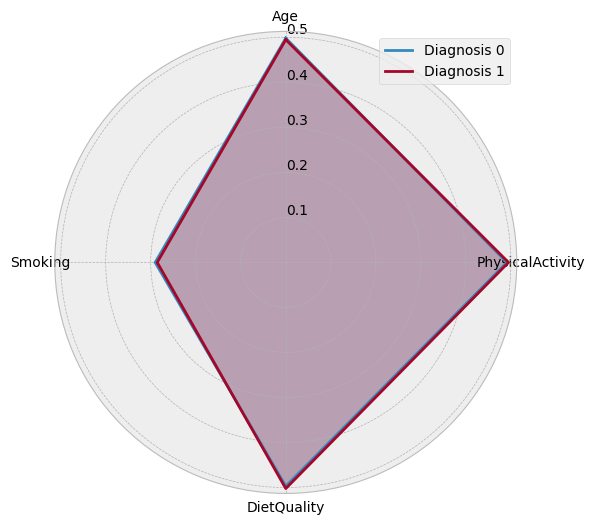

In [ ]:
from math import pi

# Normalizar los datos para el gráfico de radar.
data = alz[['Age', 'PhysicalActivity', 'DietQuality', 'Smoking']].copy()
data = (data - data.min()) / (data.max() - data.min())
data['Diagnosis'] = alz['Diagnosis']

# Datos agrupados para diagnóstico
groups = data.groupby('Diagnosis').mean()

# Trazado de gráficos de radar
labels=np.array(groups.columns)
num_vars = len(labels)

angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]

fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))

for i, (name, row) in enumerate(groups.iterrows()):
    values = row.tolist()
    values += values[:1]
    ax.plot(angles, values, label=f'Diagnosis {int(name)}')
    ax.fill(angles, values, alpha=0.25)

ax.set_theta_offset(pi / 2)
ax.set_theta_direction(-1)
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)
ax.set_rlabel_position(0)
plt.legend(loc='upper right')
plt.show()

Interpretacion:
- Edad: Ambos grupos (Diagnóstico 0 y 1) están muy próximos en cuanto a edad, sin apenas diferencias significativas.
- Actividad física: El nivel de actividad física también es casi idéntico entre los dos grupos.
- Calidad de la dieta: La calidad de la dieta es similar en todos los grupos y muestra una variación mínima.
- Fumar: Los hábitos de fumar parecen ser casi los mismos en ambos grupos.

Conclusión:
- El gráfico de radar muestra que no hay una diferencia notable entre los dos grupos (Diagnóstico 0 y 1) en estas variables. Esto podría sugerir que estos factores específicos pueden no estar tan fuertemente asociados con el diagnóstico, alineándose con el análisis de regresión, que mostró que estas variables no fueron estadísticamente significativas.



En este trabajo, aplicamos análisis de coordenadas paralelas para ver, de forma multidimensional, cómo interactúan variables de interés con respecto a variables de interés en la enfermedad de Alzheimer, como la edad, la calidad de la dieta, la actividad física y el tabaquismo. Así es como este análisis agrega valor al proyecto:

- Visualización multidimensional: nos brinda la oportunidad de ver cómo las diferentes variables cambian entre sí a lo largo de múltiples dimensiones, muy importante al tratar con conjuntos de datos complejos.

- Identificación de patrones: supongamos que trazamos a cada individuo como una línea a través de ejes; entonces, tal vez aparezcan algunos patrones o agrupaciones que indiquen relaciones entre los factores del estilo de vida y el riesgo de Alzheimer.

- Detección de valores atípicos: identifica valores atípicos o puntos de datos inusuales, muy alejados de la tendencia normal, lo que proporciona pistas para una mayor investigación.

- En general, el análisis de coordenadas paralelas proporciona una descripción general completa del conjunto de datos, lo que respalda la prueba de hipótesis y una visión más profunda de la estructura de los datos.

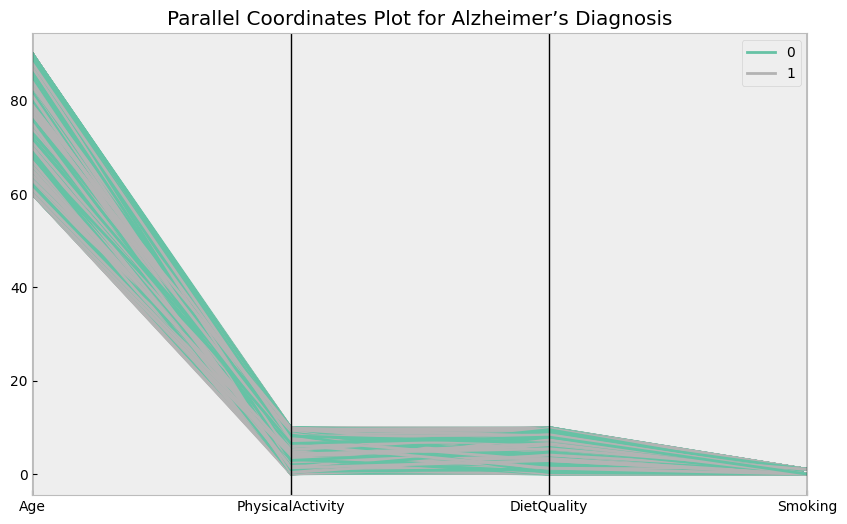

In [ ]:
from pandas.plotting import parallel_coordinates

# Seleccione los datos para coordenadas paralelas.
features = ['Age', 'PhysicalActivity', 'DietQuality', 'Smoking']
data = alz[features + ['Diagnosis']]

# Trazar coordenadas paralelas
plt.figure(figsize=(10, 6))
parallel_coordinates(data, 'Diagnosis', colormap=plt.get_cmap("Set2"))
plt.title('Parallel Coordinates Plot for Alzheimer’s Diagnosis')
plt.show()

Para explorar las interacciones entre variables y el diagnóstico de Alzheimer utilizando Python, podemos crear un mapa de calor de matriz de correlación y gráficos de pares. Aquí está el código para generar estos elementos visuales:

<ipython-input-37-dbd1f0c57d61>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data1['Diagnosis'] = data1['Diagnosis'].astype(int)


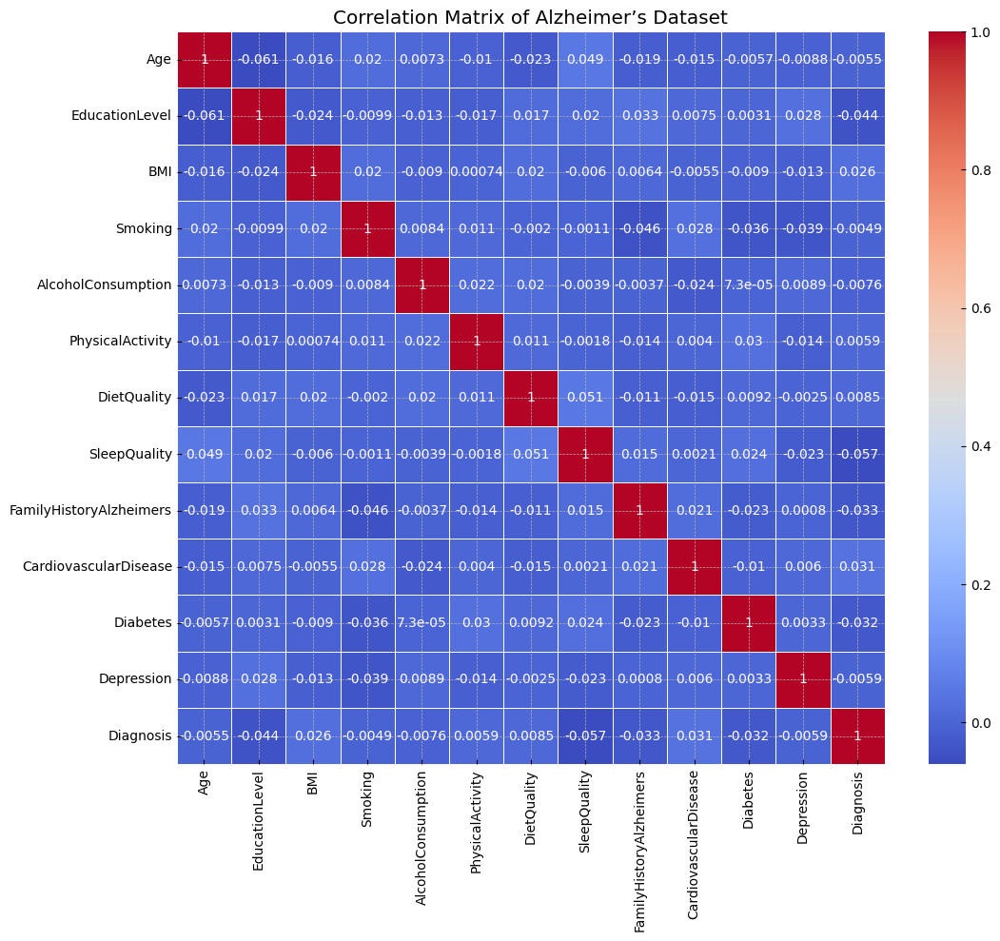

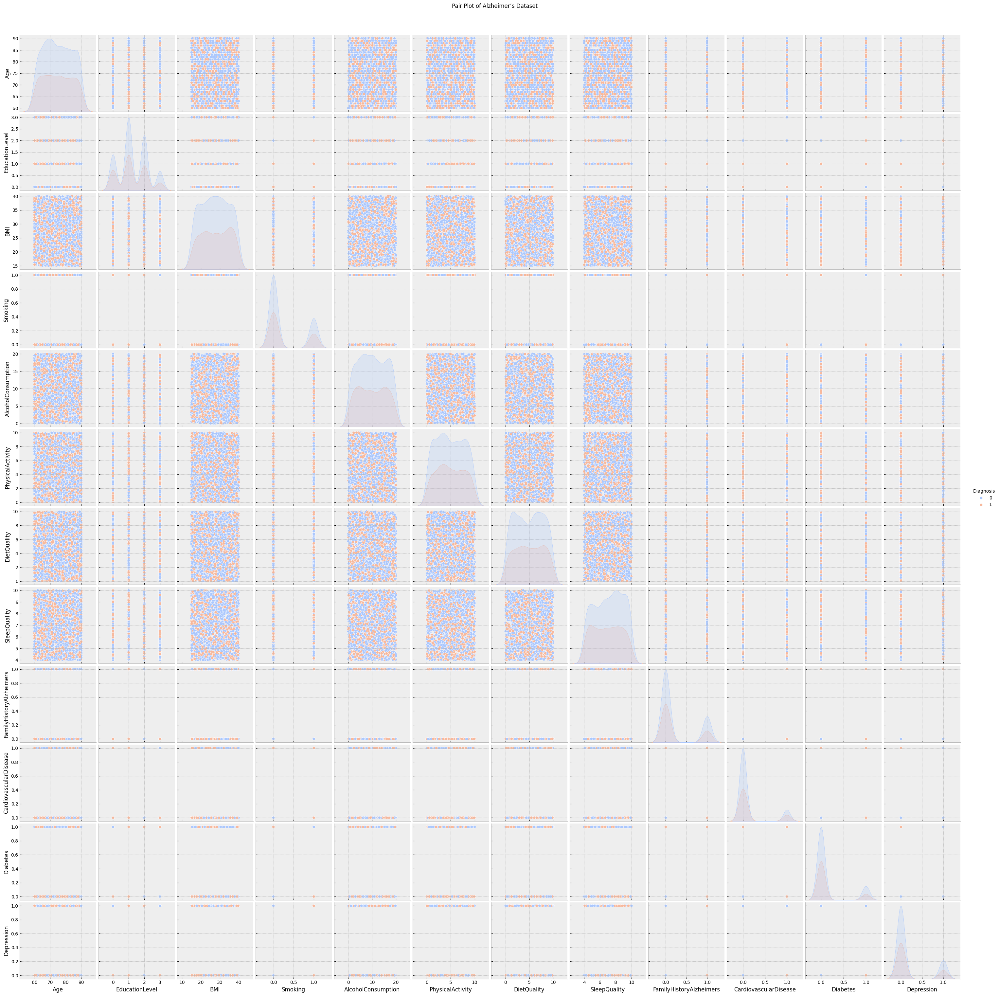

In [ ]:
# Seleccionar columnas relevantes para el análisis
columns = ['Age', 'EducationLevel', 'BMI', 'Smoking', 'AlcoholConsumption',
           'PhysicalActivity', 'DietQuality', 'SleepQuality',
           'FamilyHistoryAlzheimers', 'CardiovascularDisease', 'Diabetes',
           'Depression', 'Diagnosis']

# Filtrar el conjunto de datos para incluir solo las columnas seleccionadas
data1 = alz[columns]

# Convertir 'Diagnóstico' a numérico si es categórico
data1['Diagnosis'] = data1['Diagnosis'].astype(int)

# Matriz de correlación
correlation_matrix = data1.corr()

# Trazando el mapa de calor
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Alzheimer’s Dataset')
plt.show()

# Gráfico de pares para visualizar interacciones.
sns.pairplot(data1, hue='Diagnosis', palette='coolwarm', diag_kind='kde')
plt.suptitle('Pair Plot of Alzheimer’s Dataset', y=1.02)
plt.show()

#Hipotesis 2: Factores del estilo de vida: la mala calidad de la dieta, la baja actividad física y el tabaquismo se correlacionan positivamente con la enfermedad de Alzheimer.

- Se está calculando estadísticas básicas (media, desviación estándar, etc.) para las variables de interés: calidad de la dieta, actividad física y tabaquismo.

- Por qué: esto proporciona una comprensión fundamental de los datos y revela las tendencias centrales y la dispersión.
- Ayuda a identificar posibles valores atípicos o anomalías y brinda una descripción general de la distribución de cada variable, esencial para la prueba de hipótesis.

In [ ]:
# Calcular estadísticas descriptivas
descriptive_stats = alz[['DietQuality', 'PhysicalActivity', 'Smoking']].describe()
print(descriptive_stats)

       DietQuality  PhysicalActivity      Smoking
count  2149.000000       2149.000000  2149.000000
mean      4.993138          4.920202     0.288506
std       2.909055          2.857191     0.453173
min       0.009385          0.003616     0.000000
25%       2.458455          2.570626     0.000000
50%       5.076087          4.766424     0.000000
75%       7.558625          7.427899     1.000000
max       9.998346          9.987429     1.000000


Analisis:
- DietaCalidad y Actividad Física:
 - Ambas variables tienen medias similares (alrededor de 5), lo que indica que los valores promedio están centrados en el rango.
 - La mediana (50%) también refleja esta concentración media.
 - Las desviaciones estándar altas sugieren una variabilidad considerable en estas medidas entre la población.
- De fumar:
  - Una media de 0,29 indica que es probable que menos de un tercio de la muestra sean fumadores, dado que fumar es una variable binaria (0 o 1).
  - El percentil del 75% es 1, lo que confirma que hasta una cuarta parte de los participantes son fumadores.

Se busca crear visualizaciones (histogramas y diagramas de dispersión) que muestran las distribuciones de variables y sus relaciones por pares de las variables calidad de dieta, actividad fisica y fumadores.
- La EDA ayuda a identificar patrones, relaciones y posibles problemas con los datos, como asimetrías o valores atípicos.

- Nos permite inspeccionar visualmente las variables y verificar si existe alguna correlación o distribución aparente que pueda respaldar su hipótesis.

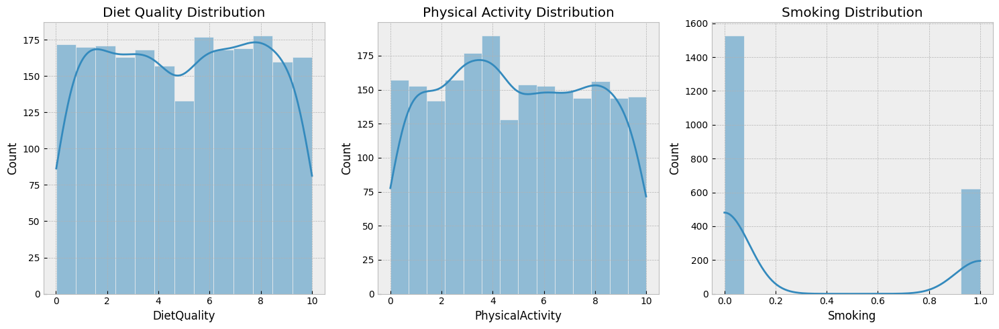

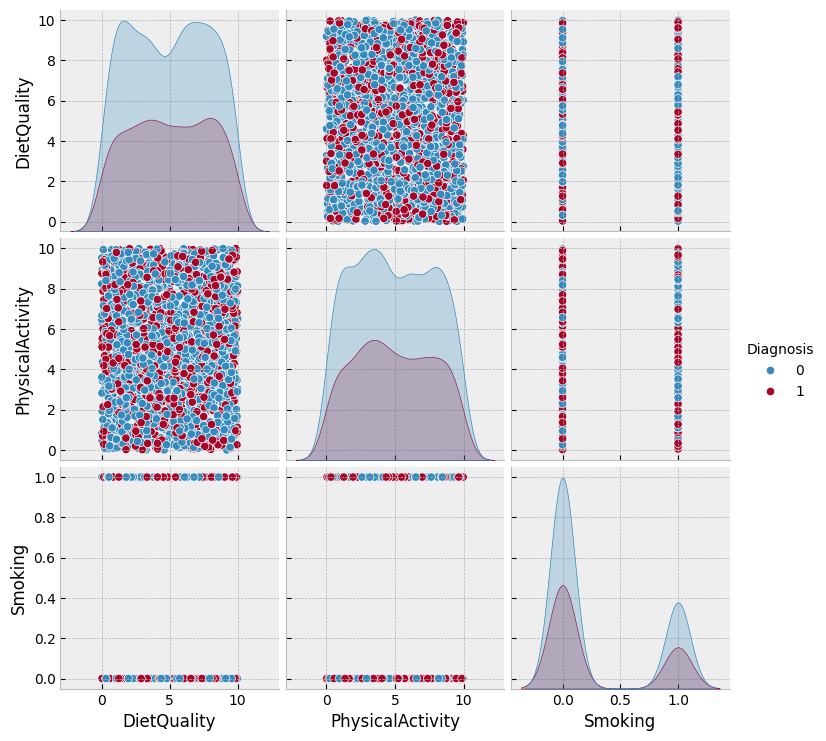

In [ ]:
# Histograms para cada variable
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
sns.histplot(alz['DietQuality'], kde=True, ax=axes[0])
axes[0].set_title('Diet Quality Distribution')

sns.histplot(alz['PhysicalActivity'], kde=True, ax=axes[1])
axes[1].set_title('Physical Activity Distribution')

sns.histplot(alz['Smoking'], kde=True, ax=axes[2])
axes[2].set_title('Smoking Distribution')

plt.tight_layout()
plt.show()

# Diagramas de dispersión entre variables
sns.pairplot(alz[['DietQuality', 'PhysicalActivity', 'Smoking', 'Diagnosis']], hue='Diagnosis')
plt.show()

Conclusion

Análisis de regresión (regresión logística)

- Se busca usar la regresión logística para modelar la relación entre la variable dependiente (Diagnóstico) y las variables independientes (Calidad de la dieta, Actividad física, Tabaquismo).

- Este paso cuantifica la fuerza y ​​dirección de la relación entre las variables independientes y la probabilidad de padecer Alzheimer.

- El resultado de la regresión logística ayudará a evaluar la importancia de estas relaciones y su poder predictivo.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.64      1.00      0.78       277
           1       0.00      0.00      0.00       153

    accuracy                           0.64       430
   macro avg       0.32      0.50      0.39       430
weighted avg       0.41      0.64      0.50       430

ROC AUC: 0.43828602439772535


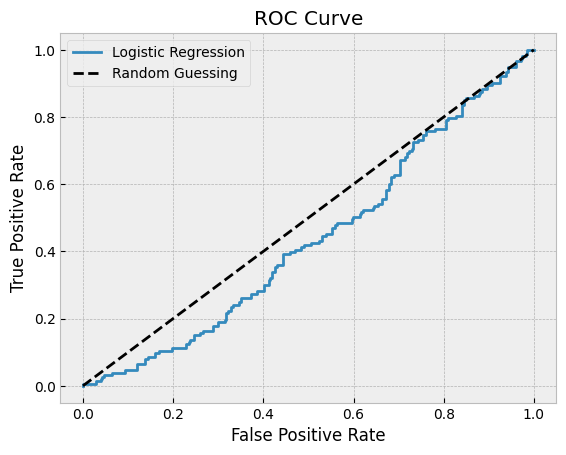

In [ ]:

#Dividimos los datos
X = alz[['DietQuality', 'PhysicalActivity', 'Smoking']]
y = alz['Diagnosis']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Regression logisitica
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)
y_pred = log_reg.predict(X_test)
y_pred_proba = log_reg.predict_proba(X_test)[:, 1]

# Evaluación
print(classification_report(y_test, y_pred))
print('ROC AUC:', roc_auc_score(y_test, y_pred_proba))

# Curva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
plt.plot(fpr, tpr, label='Logistic Regression')
plt.plot([0, 1], [0, 1], 'k--', label='Random Guessing')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()


Conclusión
- El modelo predice perfectamente todos los casos distintos de Alzheimer (precisión de 0,64 y recuperación de 1,00 para la clase 0). Sin embargo, no logra predecir correctamente los casos de Alzheimer (clase 1), ya que tanto la precisión como el recuerdo son 0,00.
- La precisión general es 0,64, lo que sugiere que el modelo predice correctamente el 64% de los casos. Sin embargo, esto puede ser engañoso ya que no funciona bien en las predicciones de Alzheimer.
- F1-Score: esta métrica combina precisión y recuperación, destacando un desequilibrio severo, con un promedio ponderado de 0,50.
- Análisis de curva ROC: ROC AUC (área bajo la curva): con un AUC de 0,438, el modelo funciona mal, cerca de una conjetura aleatoria (AUC = 0,5). Esto indica que el modelo tiene dificultades para distinguir entre pacientes con y sin enfermedad de Alzheimer.
- Trascendencia: Debilidad del modelo: el modelo actual no captura eficazmente los patrones asociados con el Alzheimer en el conjunto de datos. Una reevaluación de las características o un enfoque de modelado diferente (por ejemplo, bosque aleatorio, SVM) puede mejorar el rendimiento.
Desequilibrio de clases: la mala predicción de los casos de Alzheimer podría deberse a un desequilibrio en el conjunto de datos. Técnicas como SMOTE o ajustar el peso de las clases podrían ayudar.
- El análisis de la importancia de las características puede proporcionar información sobre qué variables son más influyentes, guiando la selección de características o los esfuerzos de ingeniería.
Este análisis subraya la necesidad de realizar más investigaciones y perfeccionar el modelo para mejorar la precisión predictiva y la confiabilidad en el diagnóstico de la enfermedad de Alzheimer.

Técnicas de aprendizaje automático (bosque aleatorio)

- Se entrena un modelo de Random Forest para predecir el diagnóstico de Alzheimer en función de las variables.

- Es útil para identificar qué variables son las más importantes para predecir el resultado, lo que ayuda a centrarse en factores clave para estudios posteriores.

              precision    recall  f1-score   support

           0       0.63      0.73      0.68       277
           1       0.33      0.24      0.28       153

    accuracy                           0.55       430
   macro avg       0.48      0.48      0.48       430
weighted avg       0.52      0.55      0.53       430

ROC AUC: 0.5055567353295108


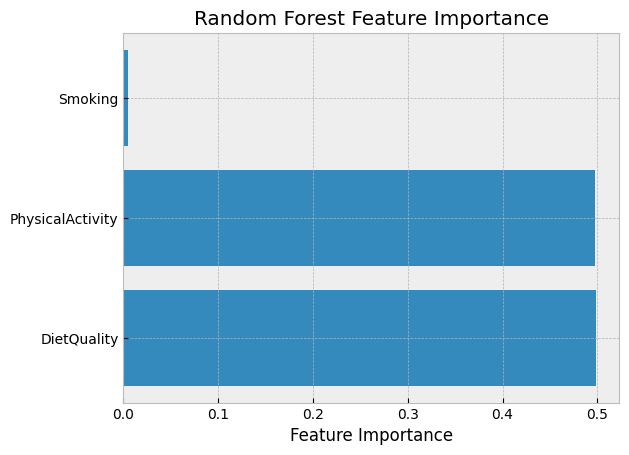

In [ ]:
# Random Forest Classifier
rf_clf = RandomForestClassifier(random_state=42)
rf_clf.fit(X_train, y_train)
y_pred_rf = rf_clf.predict(X_test)
y_pred_proba_rf = rf_clf.predict_proba(X_test)[:, 1]

# Evaluación
print(classification_report(y_test, y_pred_rf))
print('ROC AUC:', roc_auc_score(y_test, y_pred_proba_rf))

# Importancia de la características
feature_importances = rf_clf.feature_importances_
feature_names = X.columns

# Trazar la importancia de las características
plt.barh(feature_names, feature_importances)
plt.xlabel('Feature Importance')
plt.title('Random Forest Feature Importance')
plt.show()


Conclusión

- Rendimiento del modelo: el modelo Random Forest muestra una precisión promedio ponderada de 0,52, una recuperación de 0,55 y una puntuación F1 de 0,53, con un AUC ROC de 0,51. Estas métricas sugieren que el modelo tiene un poder predictivo moderado pero podría no ser muy confiable para distinguir entre clases. La precisión es baja, lo que indica que el modelo tiene dificultades para predecir con precisión el diagnóstico de Alzheimer.

- Entre las características, la actividad física y la calidad de la dieta parecen contribuir más significativamente a las predicciones del modelo en comparación con fumar. Esto sugiere que estos dos factores tienen una asociación más fuerte con el diagnóstico de Alzheimer en el conjunto de datos utilizado.

- La importancia relativamente baja del tabaquismo implica que puede no ser un predictor independiente sólido de la enfermedad de Alzheimer en este conjunto de datos. Sin embargo, aún podría ser influyente cuando se combina con otros factores.

- En general, estos resultados pueden guiar futuras investigaciones sobre el impacto de los factores del estilo de vida en el Alzheimer, lo que sugiere que si bien la calidad de la dieta y la actividad física son importantes, fumar podría requerir contexto adicional o términos de interacción para revelar su efecto.

Visualización de la importancia de las características del modelo Random Forest.

- Esto ayuda a comprender la importancia relativa de cada variable en la predicción del Alzheimer.

- Nos permite priorizar qué factores del estilo de vida podrían ser más influyentes y requerir una investigación o intervención más detallada.

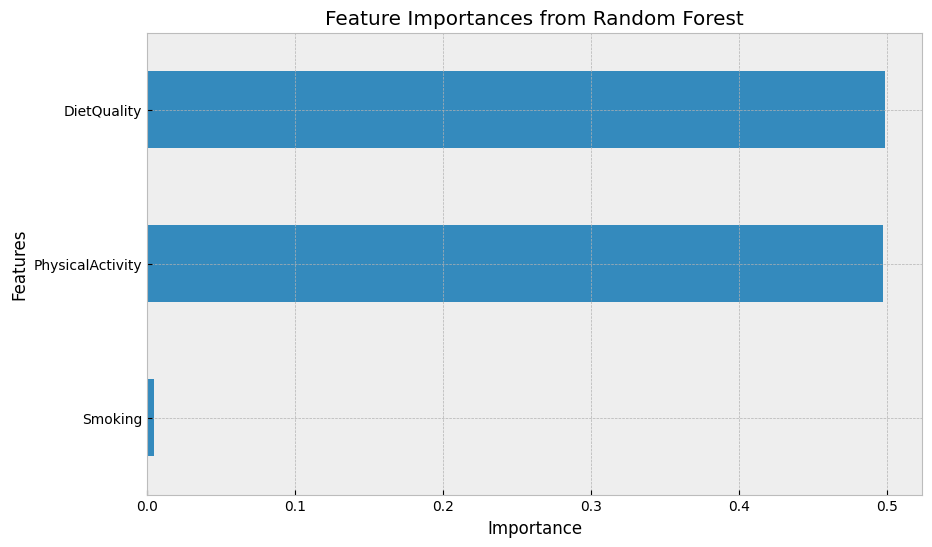

In [ ]:
# Importancia de las características del modelo Random Forest
importances = pd.Series(rf_clf.feature_importances_, index=X.columns)
importances = importances.sort_values()

plt.figure(figsize=(10, 6))
importances.plot(kind='barh')
plt.title('Feature Importances from Random Forest')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()

El analisis indica que la variable fumar no es tan importante

#Hipoetesis 3: Historial médico: los pacientes con antecedentes familiares de Alzheimer, enfermedades cardiovasculares y diabetes tienen más probabilidades de ser diagnosticados con la enfermedad de Alzheimer.

Hacemos un analisis descriptivo de las variables a analizar

       FamilyHistoryAlzheimers  CardiovascularDisease     Diabetes
count              2149.000000            2149.000000  2149.000000
mean                  0.252210               0.144253     0.150768
std                   0.434382               0.351428     0.357906
min                   0.000000               0.000000     0.000000
25%                   0.000000               0.000000     0.000000
50%                   0.000000               0.000000     0.000000
75%                   1.000000               0.000000     0.000000
max                   1.000000               1.000000     1.000000


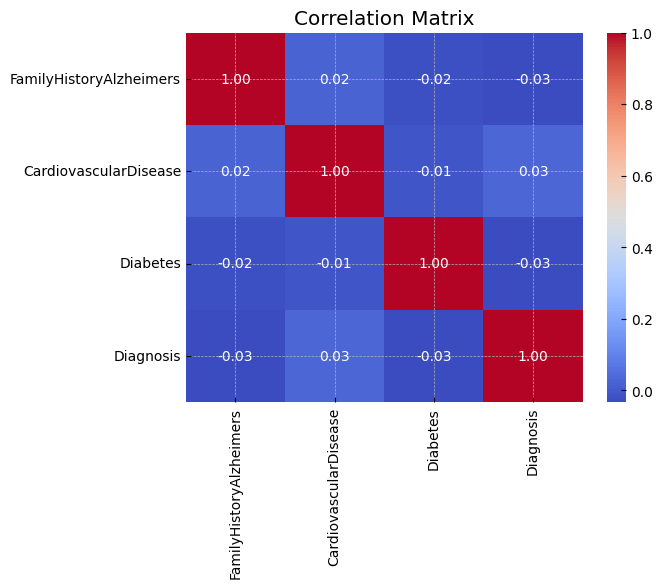

In [ ]:
# Estadísticas descriptivas
print(alz[['FamilyHistoryAlzheimers', 'CardiovascularDisease', 'Diabetes']].describe())


# Matriz de correlación
correlation_matrix = alz[['FamilyHistoryAlzheimers', 'CardiovascularDisease', 'Diabetes', 'Diagnosis']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()


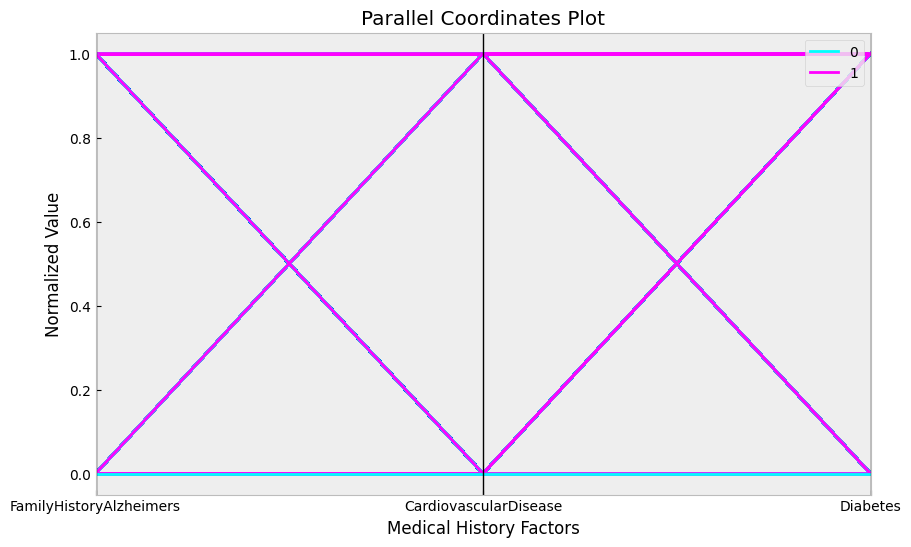

In [ ]:
# Normalizar los datos para una mejor visualización
normalized_data = (alz[['FamilyHistoryAlzheimers', 'CardiovascularDisease', 'Diabetes']] - alz[['FamilyHistoryAlzheimers', 'CardiovascularDisease', 'Diabetes']].min()) / (alz[['FamilyHistoryAlzheimers', 'CardiovascularDisease', 'Diabetes']].max() - alz[['FamilyHistoryAlzheimers', 'CardiovascularDisease', 'Diabetes']].min())
normalized_data['Diagnosis'] = alz['Diagnosis']

# Trazado de coordenadas paralelas
plt.figure(figsize=(10, 6))
parallel_coordinates(normalized_data, 'Diagnosis', colormap='cool')
plt.title('Parallel Coordinates Plot')
plt.xlabel('Medical History Factors')
plt.ylabel('Normalized Value')
plt.show()

Cuando un gráfico de coordenadas paralelas aparece entrecruzado, normalmente indica un alto grado de variabilidad o falta de correlación entre las variables que se están trazando. Cada línea en el gráfico representa una observación, y cuanto más se cruzan las líneas, más diversos son los puntos de datos en las diferentes dimensiones12.

Este entrecruzamiento puede dificultar el discernimiento de patrones o relaciones claras dentro de los datos. Sin embargo, también puede resaltar la complejidad y la naturaleza multidimensional del conjunto de datos, lo que podría requerir análisis o filtrado adicionales para descubrir información significativa.

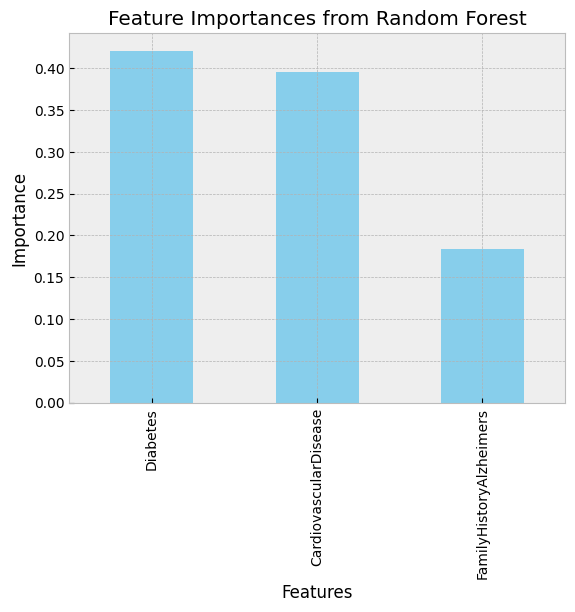

In [ ]:
# Características y variable objetivo
X = alz[['FamilyHistoryAlzheimers', 'CardiovascularDisease', 'Diabetes']]
y = alz['Diagnosis']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Random Forest model
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Importancia de la característica
importances = rf.feature_importances_
feature_importances = pd.Series(importances, index=X.columns).sort_values(ascending=False)

# Trazar la importancia de las características
feature_importances.plot(kind='bar', color='skyblue')
plt.title('Feature Importances from Random Forest')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.show()

Entre estas variables, parece que hay mas importancia en lo que es diabetes y enfermedades cardiovascualres que el historial familiar de alzheimers

#Conclusion

El análisis realizado en este proyecto ofrece una comprensión fundamental de la relación entre varios factores y la enfermedad de Alzheimer. Al examinar cuidadosamente los datos, exploramos la influencia de la demografía, las elecciones de estilo de vida y el historial médico en el riesgo de desarrollar Alzheimer. Nuestros modelos, incluida la regresión logística y el bosque aleatorio, proporcionaron información sobre estos factores, y los antecedentes familiares, la actividad física y las enfermedades cardiovasculares emergieron como predictores importantes.

Los estudios futuros podrían perfeccionar estos modelos, explorar variables adicionales y profundizar nuestra comprensión de la progresión del Alzheimer, ayudando en la intervención temprana y las estrategias de atención personalizada.

In [ ]:
#